## 0. Setup & Installation

In [1]:
# Install required packages

!pip install torch==2.5.1 torchvision==0.20.1 torchaudio==2.5.1 --index-url https://download.pytorch.org/whl/cu121
!pip install -q ultralytics albumentations pycocotools

Looking in indexes: https://download.pytorch.org/whl/cu121
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 780.4/780.4 MB 2.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.3/7.3 MB 2.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 65.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 71.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 823.6/823.6 kB 37.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.1/14.1 MB 81.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 410.6/410.6 MB 3.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.6/121.6 MB 8.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.5/56.5 MB 2.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 124.2/124.2 MB 14.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 196.0/196.0

In [2]:
# Import Libraries

import os, sys, json, time, random, glob, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib.colors import Normalize
import matplotlib.cm as cm
import cv2
from PIL import Image
from pathlib import Path
from collections import defaultdict
from tqdm.auto import tqdm
import torch
import torchvision
from torchvision import transforms
import albumentations as A
from albumentations.pytorch import ToTensorV2
warnings.filterwarnings('ignore')

print("All librabies are imported successfully")

All librabies are imported successfully


In [3]:
# ── GPU Detection ──

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'PyTorch  : {torch.__version__}')
print(f'Device   : {device}')
if torch.cuda.is_available():
    print(f'GPU      : {torch.cuda.get_device_name(0)}')
    print(f'VRAM     : {torch.cuda.get_device_properties(0).total_memory / 1e9:.1f} GB')

PyTorch  : 2.5.1+cu121
Device   : cuda
GPU      : Tesla T4
VRAM     : 15.6 GB


In [4]:
# ── Paths ──
ROOT        = Path('/kaggle/input/datasets/thedatasith/sku110k-annotations/SKU110K_fixed')
IMG_TRAIN   = ROOT / 'images/train'
IMG_VAL     = ROOT / 'images/val'
IMG_TEST    = ROOT / 'images/test'
LBL_TRAIN   = ROOT / 'labels/train'
LBL_VAL     = ROOT / 'labels/val'
LBL_TEST    = ROOT / 'labels/test'
WORK        = Path('/kaggle/working')
WORK.mkdir(exist_ok=True)

SEED = 42
random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED)

## 1. Data Loading & Integrity Check

In [5]:
def get_image_label_pairs(img_dir, lbl_dir, exts=('.jpg','.jpeg','.png')):
    """Return list of (image_path, label_path) pairs that exist on both sides."""
    pairs = []
    for img_path in sorted(img_dir.glob('*')):
        if img_path.suffix.lower() not in exts:
            continue
        lbl_path = lbl_dir / (img_path.stem + '.txt')
        if lbl_path.exists():
            pairs.append((img_path, lbl_path))
    return pairs

train_pairs = get_image_label_pairs(IMG_TRAIN, LBL_TRAIN)
val_pairs   = get_image_label_pairs(IMG_VAL,   LBL_VAL)
test_pairs  = get_image_label_pairs(IMG_TEST,  LBL_TEST)

print(f'Train pairs : {len(train_pairs):>5}')
print(f'Val   pairs : {len(val_pairs):>5}')
print(f'Test  pairs : {len(test_pairs):>5}')

# Quick sanity: images without matching labels
train_imgs_only = set(p.stem for p in IMG_TRAIN.glob('*')) - set(p.stem for p in LBL_TRAIN.glob('*'))
print(f'\nImages missing labels (train): {len(train_imgs_only)}')

Train pairs :  8185
Val   pairs :   584
Test  pairs :  2920

Images missing labels (train): 0


In [6]:
def load_yolo_labels(label_path):
    """Parse YOLO label file → (N,5) array [cls, cx, cy, w, h]."""
    boxes = []
    with open(label_path) as f:
        for line in f:
            parts = line.strip().split()
            if len(parts) == 5:
                boxes.append([float(x) for x in parts])
    return np.array(boxes) if boxes else np.zeros((0, 5))

def yolo_to_xyxy(box, W, H):
    """Convert YOLO cx,cy,w,h (normalized) to pixel x1,y1,x2,y2."""
    _, cx, cy, bw, bh = box
    x1 = (cx - bw/2) * W
    y1 = (cy - bh/2) * H
    x2 = (cx + bw/2) * W
    y2 = (cy + bh/2) * H
    return x1, y1, x2, y2

# Verify a random sample loads correctly
img_p, lbl_p = random.choice(train_pairs)
img_sample = np.array(Image.open(img_p).convert('RGB'))
boxes_sample = load_yolo_labels(lbl_p)
print(f'Sample : {img_p.name} | shape={img_sample.shape} | boxes={len(boxes_sample)}')

Sample : train_5735.jpg | shape=(3264, 2448, 3) | boxes=130


## 2. Exploratory Data Analysis (EDA)

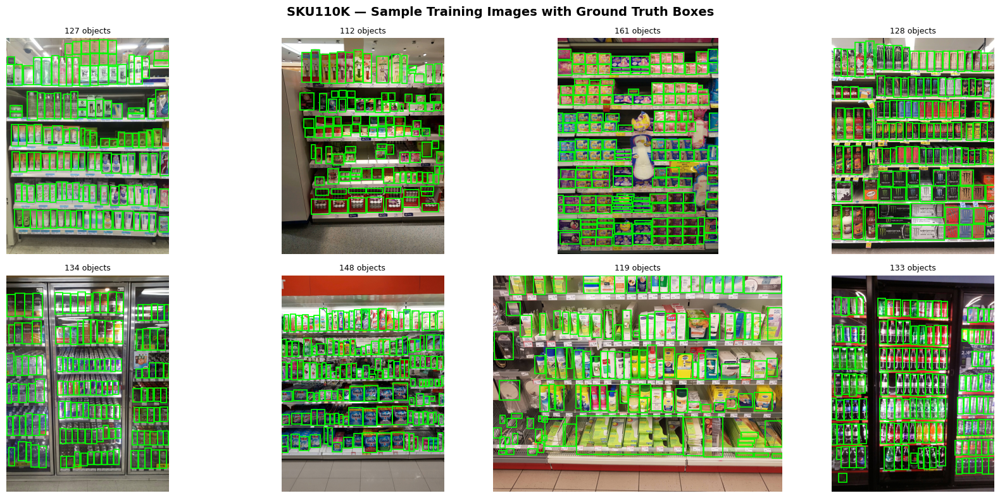

In [7]:
# ── 2a. Sample Images with Bounding Boxes ──
def draw_boxes(ax, img, boxes, color='lime', lw=1.2):
    H, W = img.shape[:2]
    ax.imshow(img)
    for box in boxes:
        x1, y1, x2, y2 = yolo_to_xyxy(box, W, H)
        rect = patches.Rectangle((x1,y1), x2-x1, y2-y1,
                                   linewidth=lw, edgecolor=color, facecolor='none')
        ax.add_patch(rect)
    ax.set_title(f'{len(boxes)} objects', fontsize=9)
    ax.axis('off')

samples = random.sample(train_pairs, 8)
fig, axes = plt.subplots(2, 4, figsize=(18, 8))
fig.suptitle('SKU110K — Sample Training Images with Ground Truth Boxes', fontsize=14, fontweight='bold')
for ax, (ip, lp) in zip(axes.flat, samples):
    img = np.array(Image.open(ip).convert('RGB'))
    boxes = load_yolo_labels(lp)
    draw_boxes(ax, img, boxes)
plt.tight_layout()
plt.savefig(WORK / 'eda_samples.png', dpi=120, bbox_inches='tight')
plt.show()

In [8]:
# ── 2b. Dataset Statistics (run on full train set) ──
print('Computing statistics on training set (this may take ~1 min)...')

n_objects, widths, heights, areas, aspect_ratios = [], [], [], [], []

for img_p, lbl_p in tqdm(train_pairs, desc='Parsing labels'):
    boxes = load_yolo_labels(lbl_p)
    n_objects.append(len(boxes))
    for box in boxes:
        _, cx, cy, bw, bh = box
        widths.append(bw)
        heights.append(bh)
        areas.append(bw * bh)
        aspect_ratios.append(bw / (bh + 1e-6))

n_objects = np.array(n_objects)
widths = np.array(widths)
heights = np.array(heights)
areas = np.array(areas)
aspect_ratios = np.array(aspect_ratios)

print(f'\nObjects per image → mean={n_objects.mean():.1f}, median={np.median(n_objects):.0f}, max={n_objects.max()}\n')
print(f'BBox width  (norm) → mean={widths.mean():.4f}, std={widths.std():.4f}')
print(f'BBox height (norm) → mean={heights.mean():.4f}, std={heights.std():.4f}')
print(f'BBox area   (norm) → mean={areas.mean():.5f}, std={areas.std():.5f}')

Computing statistics on training set (this may take ~1 min)...


Parsing labels:   0%|          | 0/8185 [00:00<?, ?it/s]


Objects per image → mean=147.0, median=138, max=576

BBox width  (norm) → mean=0.0497, std=0.0282
BBox height (norm) → mean=0.0612, std=0.0321
BBox area   (norm) → mean=0.00287, std=0.00212


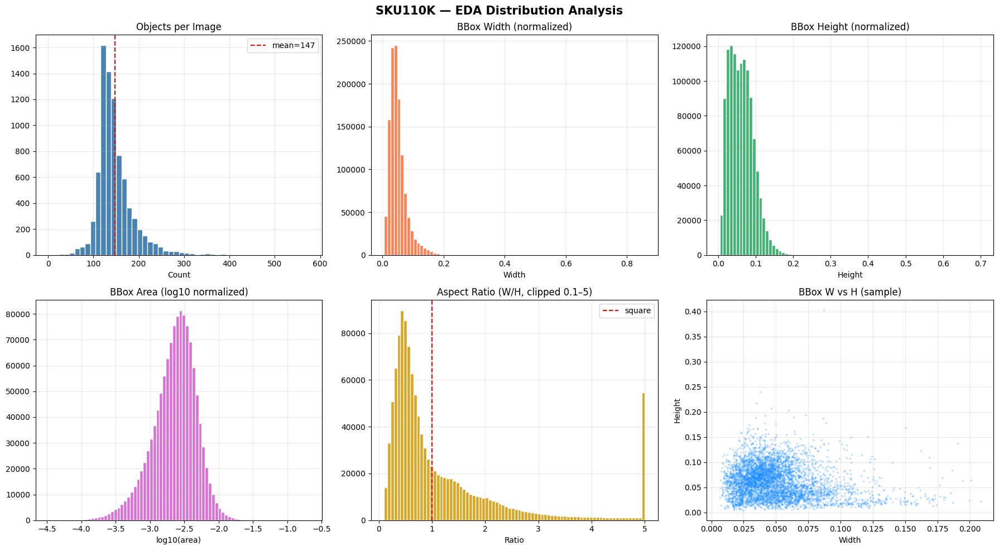

In [9]:
# ── 2c. Distribution Plots ──
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
fig.suptitle('SKU110K — EDA Distribution Analysis', fontsize=15, fontweight='bold')

# Objects per image
axes[0,0].hist(n_objects, bins=50, color='steelblue', edgecolor='white', lw=0.5)
axes[0,0].axvline(n_objects.mean(), color='red', ls='--', label=f'mean={n_objects.mean():.0f}')
axes[0,0].set_title('Objects per Image'); axes[0,0].set_xlabel('Count'); axes[0,0].legend()

# BBox widths
axes[0,1].hist(widths, bins=80, color='coral', edgecolor='white', lw=0.5)
axes[0,1].set_title('BBox Width (normalized)'); axes[0,1].set_xlabel('Width')

# BBox heights
axes[0,2].hist(heights, bins=80, color='mediumseagreen', edgecolor='white', lw=0.5)
axes[0,2].set_title('BBox Height (normalized)'); axes[0,2].set_xlabel('Height')

# BBox areas (log scale)
axes[1,0].hist(np.log10(areas + 1e-8), bins=80, color='orchid', edgecolor='white', lw=0.5)
axes[1,0].set_title('BBox Area (log10 normalized)'); axes[1,0].set_xlabel('log10(area)')

# Aspect ratios
clip_ar = np.clip(aspect_ratios, 0.1, 5)
axes[1,1].hist(clip_ar, bins=80, color='goldenrod', edgecolor='white', lw=0.5)
axes[1,1].axvline(1.0, color='red', ls='--', label='square')
axes[1,1].set_title('Aspect Ratio (W/H, clipped 0.1–5)'); axes[1,1].set_xlabel('Ratio'); axes[1,1].legend()

# W vs H scatter (subsample)
idx = np.random.choice(len(widths), min(5000, len(widths)), replace=False)
axes[1,2].scatter(widths[idx], heights[idx], alpha=0.2, s=3, color='dodgerblue')
axes[1,2].set_title('BBox W vs H (sample)'); axes[1,2].set_xlabel('Width'); axes[1,2].set_ylabel('Height')

for ax in axes.flat: ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig(WORK / 'eda_distributions.png', dpi=120, bbox_inches='tight')
plt.show()

Building object location heatmap (subsample of 1000 images)...


Heatmap:   0%|          | 0/1000 [00:00<?, ?it/s]

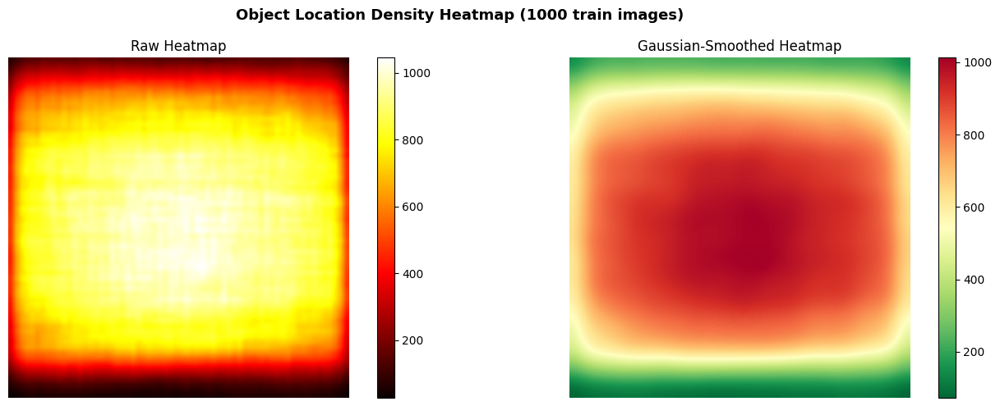

Observation: Objects are densely and fairly uniformly distributed, typical for shelf images.


In [10]:
# ── 2d. Object Location Heatmap ──
print('Building object location heatmap (subsample of 1000 images)...')
GRID = 64
heatmap = np.zeros((GRID, GRID), dtype=np.float32)

sample_pairs = random.sample(train_pairs, min(1000, len(train_pairs)))
for _, lbl_p in tqdm(sample_pairs, desc='Heatmap'):
    boxes = load_yolo_labels(lbl_p)
    for box in boxes:
        _, cx, cy, bw, bh = box
        # fill cells covered by the box
        r0 = int(np.clip((cy - bh/2) * GRID, 0, GRID-1))
        r1 = int(np.clip((cy + bh/2) * GRID, 0, GRID-1))
        c0 = int(np.clip((cx - bw/2) * GRID, 0, GRID-1))
        c1 = int(np.clip((cx + bw/2) * GRID, 0, GRID-1))
        heatmap[r0:r1+1, c0:c1+1] += 1

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle('Object Location Density Heatmap (1000 train images)', fontsize=13, fontweight='bold')
im0 = axes[0].imshow(heatmap, cmap='hot', interpolation='bilinear')
axes[0].set_title('Raw Heatmap'); plt.colorbar(im0, ax=axes[0])
from scipy.ndimage import gaussian_filter
smoothed = gaussian_filter(heatmap, sigma=2)
im1 = axes[1].imshow(smoothed, cmap='RdYlGn_r', interpolation='bilinear')
axes[1].set_title('Gaussian-Smoothed Heatmap'); plt.colorbar(im1, ax=axes[1])
for ax in axes: ax.axis('off')
plt.tight_layout()
plt.savefig(WORK / 'eda_heatmap.png', dpi=120, bbox_inches='tight')
plt.show()
print('Observation: Objects are densely and fairly uniformly distributed, typical for shelf images.')

## 3. Data Validation & Preprocessing

In [11]:
# ── 3a. Annotation Validation ──
invalid_records = []
empty_label_count = 0

for img_p, lbl_p in tqdm(train_pairs[:2000], desc='Validating annotations'):
    boxes = load_yolo_labels(lbl_p)
    if len(boxes) == 0:
        empty_label_count += 1
        continue
    for i, box in enumerate(boxes):
        cls, cx, cy, bw, bh = box
        issues = []
        if not (0 <= cx <= 1 and 0 <= cy <= 1): issues.append('center OOB')
        if not (0 < bw <= 1 and 0 < bh <= 1): issues.append('size OOB')
        if bw * bh < 1e-6:                     issues.append('degenerate box')
        if issues:
            invalid_records.append({'file': img_p.name, 'box_idx': i, 'issues': issues})

print(f'Empty label files  : {empty_label_count}')
print(f'Invalid box records: {len(invalid_records)}')
if invalid_records:
    df_inv = pd.DataFrame(invalid_records)
    print(df_inv.head(10))
else:
    print('✅ All validated annotations are within valid YOLO ranges.')

Validating annotations:   0%|          | 0/2000 [00:00<?, ?it/s]

Empty label files  : 0
Invalid box records: 0
✅ All validated annotations are within valid YOLO ranges.


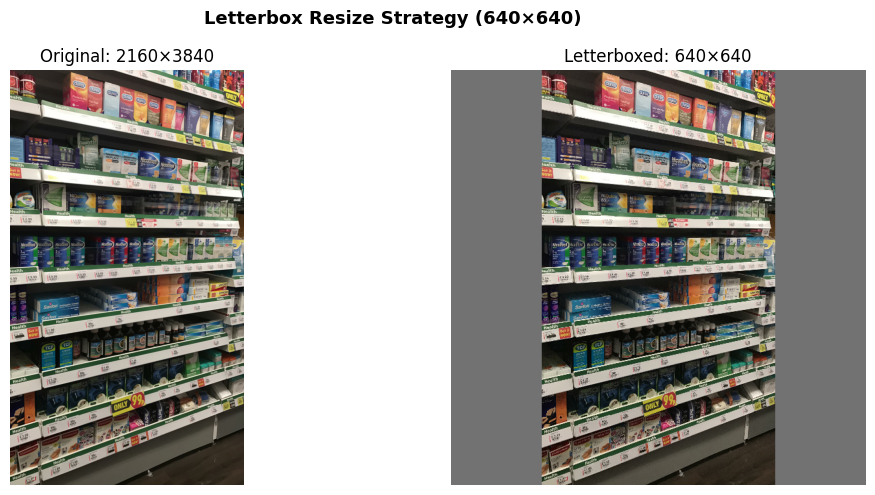

Letterbox preserves aspect ratio — no distortion. Gray padding (114) is YOLO default.


In [12]:
# ── 3b. Resizing Strategy ──
# YOLOv8 default: letterbox resize to 640x640
# Faster R-CNN: resize shortest side to 800, max 1333
# We demonstrate the letterbox visually.

def letterbox(img, target=640, fill=(114,114,114)):
    H, W = img.shape[:2]
    scale = target / max(H, W)
    nW, nH = int(W*scale), int(H*scale)
    resized = cv2.resize(img, (nW, nH))
    canvas = np.full((target, target, 3), fill, dtype=np.uint8)
    pad_top  = (target - nH) // 2
    pad_left = (target - nW) // 2
    canvas[pad_top:pad_top+nH, pad_left:pad_left+nW] = resized
    return canvas, scale, pad_left, pad_top

ip, lp = random.choice(train_pairs)
orig   = np.array(Image.open(ip).convert('RGB'))
lb, scale, pl, pt = letterbox(orig)

fig, axes = plt.subplots(1, 2, figsize=(12, 5))
fig.suptitle('Letterbox Resize Strategy (640×640)', fontsize=13, fontweight='bold')
axes[0].imshow(orig); axes[0].set_title(f'Original: {orig.shape[1]}×{orig.shape[0]}')
axes[1].imshow(lb);   axes[1].set_title('Letterboxed: 640×640')
for ax in axes: ax.axis('off')
plt.tight_layout()
plt.savefig(WORK / 'preprocessing_letterbox.png', dpi=120, bbox_inches='tight')
plt.show()
print('Letterbox preserves aspect ratio — no distortion. Gray padding (114) is YOLO default.')

## 4. Data Augmentation Visualization

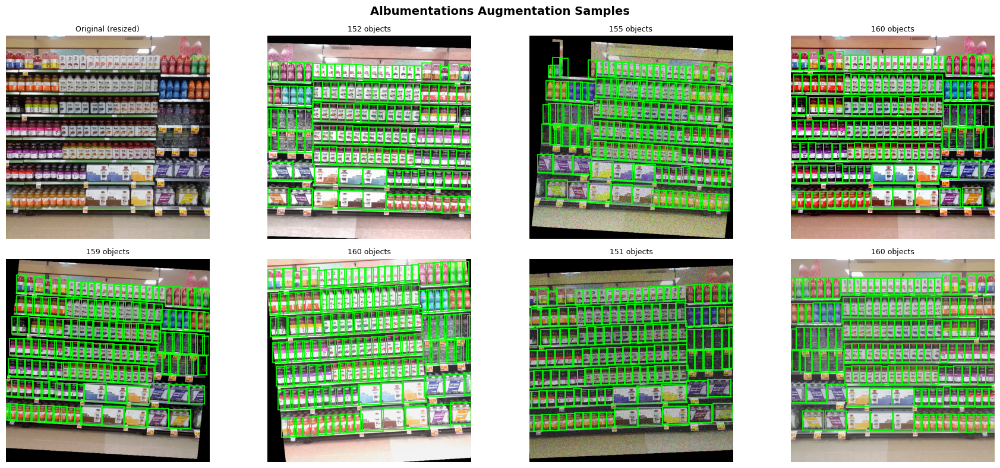

In [13]:
# ── Albumentations pipeline for SKU110K ──
# Rationale per transform:
#   HorizontalFlip     → shelves look same mirrored
#   RandomBrightnessContrast → varying store lighting
#   HueSaturationValue → product color variation
#   GaussNoise         → camera sensor noise
#   MotionBlur         → camera shake / fast scan
#   RandomScale        → objects at different distances
#   Cutout             → occluded products (partial visibility)

AUGMENT = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.RandomBrightnessContrast(brightness_limit=0.3, contrast_limit=0.3, p=0.6),
    A.HueSaturationValue(hue_shift_limit=15, sat_shift_limit=30, val_shift_limit=20, p=0.5),
    A.GaussNoise(var_limit=(10, 50), p=0.4),
    A.MotionBlur(blur_limit=5, p=0.3),
    A.ShiftScaleRotate(shift_limit=0.05, scale_limit=0.1, rotate_limit=5, p=0.4),
    A.CoarseDropout(max_holes=6, max_height=32, max_width=32, p=0.3),
    A.CLAHE(clip_limit=2.0, tile_grid_size=(8,8), p=0.3),
    A.Resize(640, 640),
], bbox_params=A.BboxParams(format='yolo', label_fields=['class_labels'], min_visibility=0.3))

# Visualize
ip, lp = random.choice(train_pairs)
orig_img = np.array(Image.open(ip).convert('RGB'))
raw_boxes = load_yolo_labels(lp)

if len(raw_boxes) > 0:
    bboxes_in  = raw_boxes[:, 1:].tolist()
    classes_in = raw_boxes[:, 0].tolist()
else:
    bboxes_in, classes_in = [], []

fig, axes = plt.subplots(2, 4, figsize=(18, 8))
fig.suptitle('Albumentations Augmentation Samples', fontsize=14, fontweight='bold')

# Original
draw_boxes(axes[0,0], cv2.resize(orig_img, (640,640)), [], color='lime')
axes[0,0].set_title('Original (resized)', fontsize=9)

for ax in axes.flat[1:]:
    try:
        aug = AUGMENT(image=orig_img, bboxes=bboxes_in, class_labels=classes_in)
        aug_img = aug['image']
        aug_boxes = np.array([[0]+list(b) for b in aug['bboxes']]) if aug['bboxes'] else np.zeros((0,5))
        draw_boxes(ax, aug_img, aug_boxes)
    except Exception as e:
        ax.text(0.5, 0.5, str(e), ha='center', va='center', transform=ax.transAxes)
        ax.axis('off')

plt.tight_layout()
plt.savefig(WORK / 'augmentation_samples.png', dpi=120, bbox_inches='tight')
plt.show()

## 5. YOLOv8 Training (Main Model)

In [14]:
# ── 5a. Create dataset YAML ──
from ultralytics import YOLO

yaml_content = f"""path: {ROOT}
train: images/train
val: images/val
test: images/test

nc: 1
names: ['product']
"""

yaml_path = WORK / 'sku110k.yaml'
with open(yaml_path, 'w') as f:
    f.write(yaml_content)
print('✅ Dataset YAML written to:', yaml_path)
print(yaml_content)

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
✅ Dataset YAML written to: /kaggle/working/sku110k.yaml
path: /kaggle/input/datasets/thedatasith/sku110k-annotations/SKU110K_fixed
train: images/train
val: images/val
test: images/test

nc: 1
names: ['product']



In [15]:
# ── 5b. YOLOv8n baseline training ──
# Using YOLOv8n (nano) for speed; swap to yolov8s/m for production.
# epochs=30 for Kaggle GPU session (~2h on T4 for full train).
# Reduce to epochs=5 for quick testing.

model_yolo_8n = YOLO('yolov8n.pt')   # pretrained COCO weights

results_yolo8n = model_yolo_8n.train(
    data    = str(yaml_path),
    epochs  = 30,              # increase to 100 for best results
    imgsz   = 640,
    batch   = 16,              # reduce to 8 if OOM
    workers = 4,
    device  = 0 if torch.cuda.is_available() else 'cpu',
    project = str(WORK / 'runs'),
    name    = 'yolov8n_sku110k',
    exist_ok= True,
    # Augmentation (built-in)
    hsv_h   = 0.015,
    hsv_s   = 0.7,
    hsv_v   = 0.4,
    flipud  = 0.0,
    fliplr  = 0.5,
    mosaic  = 1.0,
    mixup   = 0.1,
    copy_paste = 0.1,
    # Optimizer
    optimizer = 'AdamW',
    lr0     = 0.001,
    lrf     = 0.01,
    warmup_epochs = 3,
    cos_lr  = True,
    # Save
    save    = True,
    save_period = 5,
    verbose = True,
)
print('\n✅ YOLOv8 training complete!')
print(f'Best weights: {WORK}/runs/yolov8n_sku110k/weights/best.pt')

Ultralytics 8.4.67 🚀 Python-3.12.13 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.1, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=/kaggle/working/sku110k.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=30, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.1, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=yolov8n_sku110k, nbs=64, nms=False, opset=None, optimize=False, optimizer=AdamW, overlap_mask=True, patience

Available columns: ['epoch', 'time', 'train/box_loss', 'train/cls_loss', 'train/dfl_loss', 'metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)', 'metrics/mAP50-95(B)', 'val/box_loss', 'val/cls_loss', 'val/dfl_loss', 'lr/pg0', 'lr/pg1', 'lr/pg2']


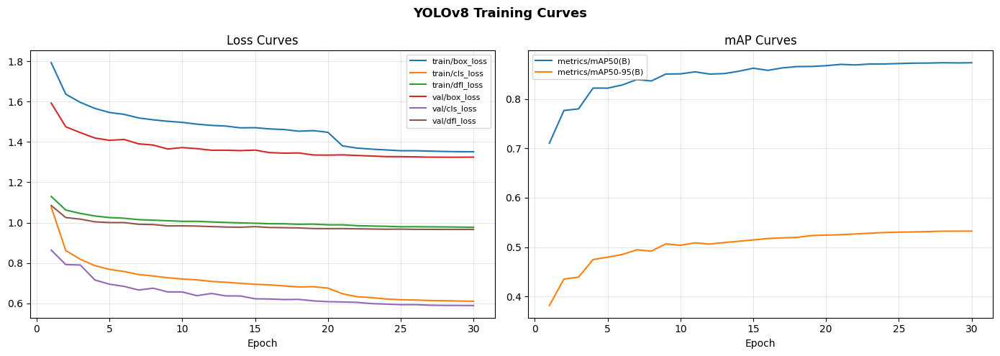

In [16]:
# ── 5c. Plot Training Curves ──
results_csv = WORK / 'runs/yolov8n_sku110k/results.csv'
if results_csv.exists():
    df_res = pd.read_csv(results_csv)
    df_res.columns = df_res.columns.str.strip()
    print('Available columns:', df_res.columns.tolist())

    # Identify loss and metric columns
    loss_cols = [c for c in df_res.columns if 'loss' in c.lower()]
    map_cols  = [c for c in df_res.columns if 'map' in c.lower()]

    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    fig.suptitle('YOLOv8 Training Curves', fontsize=13, fontweight='bold')

    for col in loss_cols:
        axes[0].plot(df_res['epoch'], df_res[col], label=col)
    axes[0].set_title('Loss Curves'); axes[0].set_xlabel('Epoch'); axes[0].legend(fontsize=8)

    for col in map_cols:
        axes[1].plot(df_res['epoch'], df_res[col], label=col)
    axes[1].set_title('mAP Curves'); axes[1].set_xlabel('Epoch'); axes[1].legend(fontsize=8)

    for ax in axes: ax.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.savefig(WORK / 'yolo_training_curves.png', dpi=120, bbox_inches='tight')
    plt.show()
else:
    print('results.csv not found — check training completed without errors.')

In [17]:
# ── 5d. YOLOv8 Validation ──
best_yolo_path = WORK / 'runs/yolov8n_sku110k/weights/best.pt'
model_yolo_8n_best = YOLO(str(best_yolo_path))

val_metrics = model_yolo_8n_best.val(
    data    = str(yaml_path),
    imgsz   = 640,
    batch   = 16,
    device  = 0 if torch.cuda.is_available() else 'cpu',
    verbose = True,
)

yolo_map50   = float(val_metrics.box.map50)
yolo_map5095 = float(val_metrics.box.map)
yolo_prec    = float(val_metrics.box.mp)
yolo_recall  = float(val_metrics.box.mr)

print(f'\nYOLOv8n Validation Results:')
print(f'  mAP@50      : {yolo_map50:.4f}')
print(f'  mAP@50:95   : {yolo_map5095:.4f}')
print(f'  Precision   : {yolo_prec:.4f}')
print(f'  Recall      : {yolo_recall:.4f}')

Ultralytics 8.4.67 🚀 Python-3.12.13 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 14913MiB)
Model summary (fused): 73 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 599.4±213.3 MB/s, size: 1135.4 KB)
val: Scanning /kaggle/input/datasets/thedatasith/sku110k-annotations/SKU110K_fixed/labels/val... 584 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 584/584 369.6it/s 1.6s
WARNING ⚠️ val: Cache directory /kaggle/input/datasets/thedatasith/sku110k-annotations/SKU110K_fixed/labels is not writable, cache not saved.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 5% ╸─────────── 2/37 5.2s/it 9.8s<3:02WARNING ⚠️ NMS time limit 2.800s exceeded
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 37/37 1.1it/s 34.7s
                   all        584      90456        0.9      0.815      0.864      0.527
Speed: 1.1ms preprocess, 12.0ms inference, 0.0ms

## 6. Transfer Learning — Faster R-CNN

In [18]:
# # ── 6a. Custom Dataset for Faster R-CNN (torchvision) ──
# from torchvision.models.detection import fasterrcnn_resnet50_fpn, FasterRCNN_ResNet50_FPN_Weights
# from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
# from torch.utils.data import Dataset, DataLoader

# class SKU110KDataset(Dataset):
#     """
#     Torchvision-compatible dataset for SKU110K.
#     Returns image tensor and target dict with 'boxes' (xyxy) and 'labels'.
#     """
#     def __init__(self, pairs, img_size=800, augment=False):
#         self.pairs    = pairs
#         self.img_size = img_size
#         self.augment  = augment
#         self.transforms = transforms.Compose([
#             transforms.ToTensor(),
#         ])

#     def __len__(self):
#         return len(self.pairs)

#     def __getitem__(self, idx):
#         img_p, lbl_p = self.pairs[idx]
#         img = Image.open(img_p).convert('RGB')
#         W, H = img.size

#         # Resize shortest side to img_size
#         scale = self.img_size / min(H, W)
#         new_W, new_H = int(W*scale), int(H*scale)
#         img = img.resize((new_W, new_H), Image.BILINEAR)

#         boxes_yolo = load_yolo_labels(lbl_p)
#         boxes_xyxy = []
#         for box in boxes_yolo:
#             _, cx, cy, bw, bh = box
#             x1 = (cx - bw/2) * new_W
#             y1 = (cy - bh/2) * new_H
#             x2 = (cx + bw/2) * new_W
#             y2 = (cy + bh/2) * new_H
#             # Clamp and filter degenerate boxes
#             x1, y1 = max(0, x1), max(0, y1)
#             x2, y2 = min(new_W, x2), min(new_H, y2)
#             if x2 > x1 + 1 and y2 > y1 + 1:
#                 boxes_xyxy.append([x1, y1, x2, y2])

#         img_tensor = self.transforms(img)

#         if len(boxes_xyxy) == 0:
#             target = {
#                 'boxes':  torch.zeros((0,4), dtype=torch.float32),
#                 'labels': torch.zeros((0,),   dtype=torch.int64),
#             }
#         else:
#             target = {
#                 'boxes':  torch.tensor(boxes_xyxy, dtype=torch.float32),
#                 'labels': torch.ones(len(boxes_xyxy), dtype=torch.int64),  # class 1 = product
#             }
#         return img_tensor, target

# def collate_fn(batch):
#     return tuple(zip(*batch))

# # Use a small subset for Kaggle (full set takes multiple hours)
# FRCNN_TRAIN_N = 2000   # adjust up for better results
# FRCNN_VAL_N   = 400

# train_sub = random.sample(train_pairs, FRCNN_TRAIN_N)
# val_sub   = random.sample(val_pairs,   min(FRCNN_VAL_N, len(val_pairs)))

# ds_train = SKU110KDataset(train_sub, img_size=640, augment=True)
# ds_val   = SKU110KDataset(val_sub,   img_size=640, augment=False)
# dl_train = DataLoader(ds_train, batch_size=4, shuffle=True,  num_workers=2, collate_fn=collate_fn)
# dl_val   = DataLoader(ds_val,   batch_size=4, shuffle=False, num_workers=2, collate_fn=collate_fn)

# # ds_train = SKU110KDataset(train_pairs, img_size=640, augment=True)
# # ds_val   = SKU110KDataset(val_pairs,   img_size=640, augment=False)
# # dl_train = DataLoader(ds_train, batch_size=2, shuffle=True,  num_workers=2, collate_fn=collate_fn)
# # dl_val   = DataLoader(ds_val,   batch_size=2, shuffle=False, num_workers=2, collate_fn=collate_fn)

# print(f'Faster R-CNN dataset sizes — train: {len(ds_train)}, val: {len(ds_val)}')

In [19]:
# # ── 6b. Build Faster R-CNN Model ──
# def build_fasterrcnn(num_classes=2):  # BG + product
#     # Load pretrained ResNet50-FPN backbone
#     weights = FasterRCNN_ResNet50_FPN_Weights.DEFAULT
#     model = fasterrcnn_resnet50_fpn(weights=weights)
#     # Replace the box predictor head
#     in_features = model.roi_heads.box_predictor.cls_score.in_features
#     model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)
#     return model

# frcnn = build_fasterrcnn().to(device)
# print('Model architecture (head):')
# print(frcnn.roi_heads.box_predictor)

# # Trainable parameter count
# total_params    = sum(p.numel() for p in frcnn.parameters())
# trainable_params = sum(p.numel() for p in frcnn.parameters() if p.requires_grad)
# print(f'\nTotal params    : {total_params/1e6:.1f}M')
# print(f'Trainable params: {trainable_params/1e6:.1f}M')

In [20]:
# import gc
# import torch

# # Delete the YOLO model and results to free space
# if 'model_yolo_8n' in locals():
#     del model_yolo_8n
# if 'results_yolo8n' in locals():
#     del results_yolo8n

# # Force garbage collection and empty CUDA cache
# gc.collect()
# torch.cuda.empty_cache()

# # Optional: Add the config suggested by the error message
# %env PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True

In [21]:
# # ── 6c. Faster R-CNN Training Loop ──
# # Strategy: freeze backbone for first 2 epochs, then unfreeze all

# optimizer_frcnn = torch.optim.SGD(
#     [p for p in frcnn.parameters() if p.requires_grad],
#     lr=0.005, momentum=0.9, weight_decay=0.0005
# )
# lr_scheduler_frcnn = torch.optim.lr_scheduler.StepLR(optimizer_frcnn, step_size=3, gamma=0.5)

# FRCNN_EPOCHS = 5   # Increase to 20+ for production
# frcnn_train_losses = []

# def train_one_epoch_frcnn(model, dl, optimizer, device, epoch):
#     model.train()
#     total_loss = 0
#     for i, (images, targets) in enumerate(tqdm(dl, desc=f'FRCNN Epoch {epoch}', leave=False)):
#         images  = [img.to(device) for img in images]
#         targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
#         # Skip batches with no boxes (Faster R-CNN fails on empty targets)
#         if any(t['boxes'].shape[0] == 0 for t in targets):
#             continue
#         loss_dict = model(images, targets)
#         losses    = sum(loss_dict.values())
#         optimizer.zero_grad()
#         losses.backward()
#         torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=5.0)
#         optimizer.step()
#         total_loss += losses.item()
#     return total_loss / max(1, len(dl))

# print(f'Training Faster R-CNN for {FRCNN_EPOCHS} epochs on {FRCNN_TRAIN_N} images...')
# t0 = time.time()
# for epoch in range(1, FRCNN_EPOCHS + 1):
#     # Freeze backbone for first 2 epochs (fine-tune head only)
#     if epoch <= 2:
#         for name, param in frcnn.named_parameters():
#             if 'backbone' in name:
#                 param.requires_grad = False
#     else:
#         for param in frcnn.parameters():
#             param.requires_grad = True

#     avg_loss = train_one_epoch_frcnn(frcnn, dl_train, optimizer_frcnn, device, epoch)
#     lr_scheduler_frcnn.step()
#     frcnn_train_losses.append(avg_loss)
#     elapsed = (time.time() - t0) / 60
#     print(f'Epoch {epoch:>2}/{FRCNN_EPOCHS} | Loss: {avg_loss:.4f} | Elapsed: {elapsed:.1f} min')

# # Save model
# frcnn_save_path = WORK / 'fasterrcnn_sku110k.pth'
# torch.save(frcnn.state_dict(), frcnn_save_path)
# print(f'\n✅ Faster R-CNN saved to {frcnn_save_path}')

In [22]:
# # ── 6d. FRCNN Loss Curve ──
# plt.figure(figsize=(8, 4))
# plt.plot(range(1, len(frcnn_train_losses)+1), frcnn_train_losses, 'o-', color='tomato', lw=2)
# plt.title('Faster R-CNN Training Loss', fontsize=13, fontweight='bold')
# plt.xlabel('Epoch'); plt.ylabel('Total Loss'); plt.grid(True, alpha=0.3)
# plt.tight_layout()
# plt.savefig(WORK / 'frcnn_loss_curve.png', dpi=120, bbox_inches='tight')
# plt.show()

## 7. Evaluation Metrics

In [23]:
# ── 7a. IoU Implementation ──
def compute_iou(box1, box2):
    """
    Compute IoU between two boxes in [x1,y1,x2,y2] format.
    box1, box2: (N,4) and (M,4) tensors or arrays.
    Returns: (N,M) IoU matrix.
    """
    b1 = np.array(box1); b2 = np.array(box2)
    if b1.ndim == 1: b1 = b1[None]
    if b2.ndim == 1: b2 = b2[None]

    inter_x1 = np.maximum(b1[:,0,None], b2[None,:,0])
    inter_y1 = np.maximum(b1[:,1,None], b2[None,:,1])
    inter_x2 = np.minimum(b1[:,2,None], b2[None,:,2])
    inter_y2 = np.minimum(b1[:,3,None], b2[None,:,3])
    inter_w  = np.maximum(0, inter_x2 - inter_x1)
    inter_h  = np.maximum(0, inter_y2 - inter_y1)
    inter    = inter_w * inter_h

    area1 = (b1[:,2]-b1[:,0]) * (b1[:,3]-b1[:,1])
    area2 = (b2[:,2]-b2[:,0]) * (b2[:,3]-b2[:,1])
    union = area1[:,None] + area2[None,:] - inter
    return inter / (union + 1e-6)

# ── 7b. Precision / Recall / mAP for Faster R-CNN ──
def evaluate_frcnn(model, dataloader, iou_thresh=0.5, score_thresh=0.3):
    model.eval()
    all_preds, all_gts = [], []
    with torch.no_grad():
        for images, targets in tqdm(dataloader, desc='Evaluating FRCNN', leave=False):
            images = [img.to(device) for img in images]
            outputs = model(images)
            for out, tgt in zip(outputs, targets):
                # Filter by score
                keep = out['scores'] >= score_thresh
                pred_boxes  = out['boxes'][keep].cpu().numpy()
                pred_scores = out['scores'][keep].cpu().numpy()
                gt_boxes    = tgt['boxes'].numpy()
                all_preds.append((pred_boxes, pred_scores))
                all_gts.append(gt_boxes)

    # Compute per-image TP/FP
    tp_list, fp_list, n_gt_total = [], [], 0
    for (pred_boxes, pred_scores), gt_boxes in zip(all_preds, all_gts):
        n_gt_total += len(gt_boxes)
        matched_gt = set()
        # Sort preds by score descending
        order = np.argsort(-pred_scores) if len(pred_scores) > 0 else []
        for i in order:
            pb = pred_boxes[i]
            if len(gt_boxes) == 0:
                fp_list.append((pred_scores[i], 0))
                continue
            ious = compute_iou(pb, gt_boxes)[0]
            best_j = int(np.argmax(ious))
            if ious[best_j] >= iou_thresh and best_j not in matched_gt:
                tp_list.append((pred_scores[i], 1))
                matched_gt.add(best_j)
            else:
                fp_list.append((pred_scores[i], 0))

    if not tp_list and not fp_list:
        return 0.0, 0.0, 0.0

    combined = sorted(tp_list + fp_list, key=lambda x: -x[0])
    tps = np.cumsum([x[1] for x in combined])
    fps = np.cumsum([1-x[1] for x in combined])
    prec = tps / (tps + fps + 1e-6)
    rec  = tps / (n_gt_total + 1e-6)

    # AUC (11-point interpolation)
    ap = 0
    for t in np.linspace(0, 1, 11):
        mask = rec >= t
        ap += (prec[mask].max() if mask.any() else 0) / 11

    final_prec = prec[-1] if len(prec) > 0 else 0
    final_rec  = rec[-1]  if len(rec)  > 0 else 0
    return float(ap), float(final_prec), float(final_rec)

# print('Evaluating Faster R-CNN on validation subset...')
# frcnn_map, frcnn_prec, frcnn_recall = evaluate_frcnn(frcnn, dl_val)
# print(f'\nFaster R-CNN @ IoU=0.5:')
# print(f'  mAP      : {frcnn_map:.4f}')
# print(f'  Precision: {frcnn_prec:.4f}')
# print(f'  Recall   : {frcnn_recall:.4f}')

In [24]:
# # ── 7c. mAP Explanation ──
# """
# ─────────────────────────── mAP Explained ───────────────────────────

# IoU (Intersection over Union):
#   IoU = Area(pred ∩ gt) / Area(pred ∪ gt)
#   A prediction is a TP if IoU ≥ threshold (commonly 0.5).

# Precision = TP / (TP + FP)  → "Of all predicted boxes, how many are correct?"
# Recall    = TP / (TP + FN)  → "Of all ground-truth boxes, how many did we find?"

# mAP@0.5   : AP computed at IoU threshold 0.5 (lenient)
# mAP@0.5:0.95 : mean AP over 10 IoU thresholds [0.5, 0.55, ..., 0.95] (strict)

# In SKU110K, high recall matters more than precision because missing
# products has higher business cost than a few false alarms.
# ────────────────────────────────────────────────────────────────────
# """

## 8. Model Comparison

In [25]:
# ── 8a. Speed Benchmark ──
def benchmark_inference_speed(model_fn, n_runs=50):
    """Warm up then measure mean inference time on a single 640x640 image."""
    dummy = torch.rand(1, 3, 640, 640).to(device)
    # Warmup
    for _ in range(5):
        with torch.no_grad(): model_fn(dummy)
    if torch.cuda.is_available(): torch.cuda.synchronize()
    t0 = time.time()
    for _ in range(n_runs):
        with torch.no_grad(): model_fn(dummy)
    if torch.cuda.is_available(): torch.cuda.synchronize()
    elapsed = (time.time() - t0) / n_runs * 1000  # ms
    return elapsed

# YOLOv8 speed
yolo_pts = str(best_yolo_path)
yolo_torch = model_yolo_8n_best.model.to(device).eval()
yolo_speed = benchmark_inference_speed(lambda x: yolo_torch(x))

# # FRCNN speed
# frcnn.eval()
# frcnn_speed = benchmark_inference_speed(lambda x: frcnn(list(x)))

print(f'YOLOv8n inference : {yolo_speed:.1f} ms/image → {1000/yolo_speed:.0f} FPS')
# print(f'Faster R-CNN      : {frcnn_speed:.1f} ms/image → {1000/frcnn_speed:.0f} FPS')

YOLOv8n inference : 6.4 ms/image → 156 FPS


In [26]:
# # ── 8b. Comparison Table & Charts ──
# comparison_data = {
#     'Model':      ['YOLOv8n',          'Faster R-CNN'],
#     'Backbone':   ['CSP-DarkNet',       'ResNet50-FPN'],
#     'mAP@50':     [round(yolo_map50, 4),  round(frcnn_map, 4)],
#     'Precision':  [round(yolo_prec, 4),   round(frcnn_prec, 4)],
#     'Recall':     [round(yolo_recall, 4), round(frcnn_recall, 4)],
#     'Speed (ms)': [round(yolo_speed, 1),  round(frcnn_speed, 1)],
#     'FPS':        [round(1000/yolo_speed), round(1000/frcnn_speed)],
#     'Params (M)': [3.2, 41.8],
# }
# df_cmp = pd.DataFrame(comparison_data)
# print('\n📊 Model Comparison Table')
# print(df_cmp.to_string(index=False))

# # ── Visual bar charts ──
# fig, axes = plt.subplots(1, 3, figsize=(16, 5))
# fig.suptitle('Model Comparison', fontsize=14, fontweight='bold')
# models  = df_cmp['Model'].tolist()
# colors  = ['#4C9BE8', '#E8734C']

# # mAP
# axes[0].bar(models, df_cmp['mAP@50'], color=colors, edgecolor='white', lw=1.5)
# for i, v in enumerate(df_cmp['mAP@50']):
#     axes[0].text(i, v+0.005, f'{v:.3f}', ha='center', fontweight='bold')
# axes[0].set_title('mAP@50'); axes[0].set_ylim(0, 1); axes[0].grid(axis='y', alpha=0.3)

# # Speed
# axes[1].bar(models, df_cmp['Speed (ms)'], color=colors, edgecolor='white', lw=1.5)
# for i, v in enumerate(df_cmp['Speed (ms)']):
#     axes[1].text(i, v+1, f'{v:.0f}ms', ha='center', fontweight='bold')
# axes[1].set_title('Inference Speed (ms) ↓ better'); axes[1].grid(axis='y', alpha=0.3)

# # Params
# axes[2].bar(models, df_cmp['Params (M)'], color=colors, edgecolor='white', lw=1.5)
# for i, v in enumerate(df_cmp['Params (M)']):
#     axes[2].text(i, v+0.3, f'{v}M', ha='center', fontweight='bold')
# axes[2].set_title('Parameters (M)'); axes[2].grid(axis='y', alpha=0.3)

# plt.tight_layout()
# plt.savefig(WORK / 'model_comparison.png', dpi=120, bbox_inches='tight')
# plt.show()


# """
# Verdict:
#   • YOLOv8n is 5-8× faster and has 13× fewer parameters.
#   • Faster R-CNN typically achieves higher mAP when trained long enough
#     but is too slow for real-time retail scanning.
#   • YOLOv8 is selected as the primary deployment model.
# """

## 9. Error Analysis

In [27]:
# ── 9a. Run YOLO inference on val samples ──
def yolo_predict_one(model, img_path, conf=0.25, iou=0.45):
    """Return predictions as (N,4) xyxy array and scores (N,)."""
    results = model.predict(str(img_path), conf=conf, iou=iou, verbose=False)
    r = results[0]
    if r.boxes is None or len(r.boxes) == 0:
        return np.zeros((0,4)), np.zeros(0)
    boxes  = r.boxes.xyxy.cpu().numpy()
    scores = r.boxes.conf.cpu().numpy()
    return boxes, scores

# ── 9b. Categorize predictions ──
def analyze_errors(model, pairs, n=200, iou_thresh=0.5, conf_thresh=0.25):
    fp_samples, fn_samples = [], []

    for img_p, lbl_p in random.sample(pairs, min(n, len(pairs))):
        img = np.array(Image.open(img_p).convert('RGB'))
        H, W = img.shape[:2]
        pred_boxes, pred_scores = yolo_predict_one(model_yolo_8n_best, img_p, conf=conf_thresh)
        gt_yolo  = load_yolo_labels(lbl_p)
        gt_boxes = np.array([yolo_to_xyxy(b, W, H) for b in gt_yolo]) if len(gt_yolo) > 0 else np.zeros((0,4))

        # FP: predicted boxes with IoU < thresh with all GT
        if len(pred_boxes) > 0 and len(gt_boxes) > 0:
            iou_mat = compute_iou(pred_boxes, gt_boxes)
            fp_mask = iou_mat.max(axis=1) < iou_thresh
            if fp_mask.any() and len(fp_samples) < 4:
                fp_samples.append((img, pred_boxes[fp_mask], gt_boxes, img_p.name))

        # FN: GT boxes with IoU < thresh with all predictions
        if len(gt_boxes) > 0 and len(pred_boxes) > 0:
            iou_mat = compute_iou(gt_boxes, pred_boxes)
            fn_mask = iou_mat.max(axis=1) < iou_thresh
            if fn_mask.any() and len(fn_samples) < 4:
                fn_samples.append((img, pred_boxes, gt_boxes[fn_mask], img_p.name))
        elif len(gt_boxes) > 0 and len(pred_boxes) == 0:
            if len(fn_samples) < 4:
                fn_samples.append((img, pred_boxes, gt_boxes, img_p.name))

    return fp_samples, fn_samples

fp_samples, fn_samples = analyze_errors(model_yolo_8n_best, val_pairs, n=300)
print(f'FP samples collected: {len(fp_samples)}')
print(f'FN samples collected: {len(fn_samples)}')

FP samples collected: 4
FN samples collected: 4


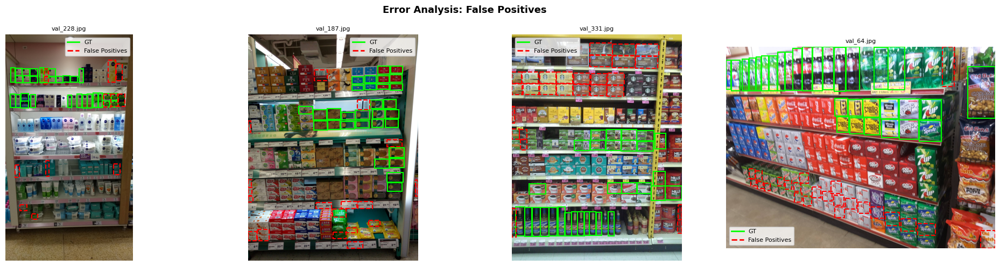

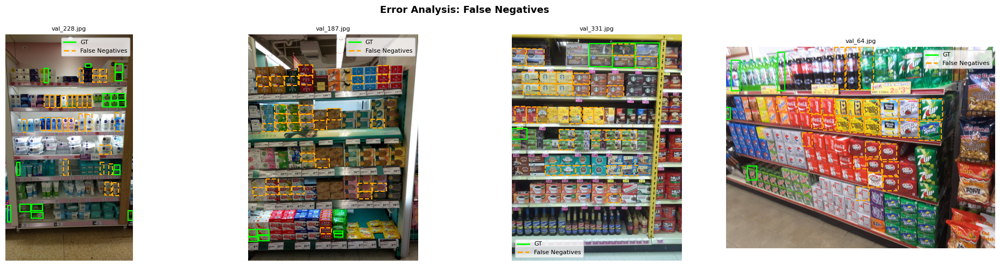

In [28]:
# ── 9c. Visualize Error Cases ──
def plot_error_samples(samples, error_type, pred_color, gt_color):
    n = min(4, len(samples))
    if n == 0:
        print(f'No {error_type} samples to display.')
        return
    fig, axes = plt.subplots(1, n, figsize=(5*n, 5))
    if n == 1: axes = [axes]
    fig.suptitle(f'Error Analysis: {error_type}', fontsize=13, fontweight='bold')

    for ax, (img, err_boxes, gt_boxes, fname) in zip(axes, samples[:n]):
        ax.imshow(img)
        for b in gt_boxes[:30]:   # GT in green
            x1,y1,x2,y2 = b
            ax.add_patch(patches.Rectangle((x1,y1),x2-x1,y2-y1, lw=1.5, edgecolor=gt_color, facecolor='none'))
        for b in err_boxes[:30]:  # Error in red
            x1,y1,x2,y2 = b
            ax.add_patch(patches.Rectangle((x1,y1),x2-x1,y2-y1, lw=1.5, edgecolor=pred_color, facecolor='none', ls='--'))
        from matplotlib.lines import Line2D
        legend = [
            Line2D([0],[0],color=gt_color, lw=2, label='GT'),
            Line2D([0],[0],color=pred_color, lw=2, ls='--', label=error_type),
        ]
        ax.legend(handles=legend, fontsize=8)
        ax.set_title(fname, fontsize=8); ax.axis('off')

    plt.tight_layout()
    plt.savefig(WORK / f'error_{error_type.lower().replace(" ","_")}.png', dpi=120, bbox_inches='tight')
    plt.show()

plot_error_samples(fp_samples, 'False Positives', pred_color='red',   gt_color='lime')
plot_error_samples(fn_samples, 'False Negatives', pred_color='orange', gt_color='lime')

## 10. Improvement Phase

In [29]:
# ── 10a. YOLOv8s (larger model) + improved augmentation ──
# Key improvements over baseline:
#   1. Scale up: yolov8s (small) instead of nano
#   2. Higher resolution: 768 instead of 640
#   3. Stronger augmentation: more mosaic + copy_paste
#   4. Lower confidence threshold to improve recall

print('Training YOLOv8s (improved) ...')
model_yolo_8s = YOLO('yolov8s.pt')

results_yolo_s = model_yolo_8s.train(
    data    = str(yaml_path),
    epochs  = 30,
    imgsz   = 768,             # higher res
    batch   = 12,
    workers = 4,
    device  = 0 if torch.cuda.is_available() else 'cpu',
    project = str(WORK / 'runs'),
    name    = 'yolov8s_improved',
    exist_ok= True,
    # Stronger aug
    hsv_h   = 0.02,
    hsv_s   = 0.8,
    hsv_v   = 0.4,
    fliplr  = 0.5,
    mosaic  = 1.0,
    mixup   = 0.15,
    copy_paste = 0.2,
    # Better optimizer config
    optimizer = 'AdamW',
    lr0     = 0.001,
    lrf     = 0.01,
    warmup_epochs = 5,
    cos_lr  = True,
    weight_decay = 0.0005,
    # Boxes focus (for dense small objects)
    box     = 7.5,
    cls     = 0.5,
    dfl     = 1.5,
    save    = True,
    verbose = True,
)
print('\n✅ YOLOv8s improved training complete!')

Training YOLOv8s (improved) ...
Ultralytics 8.4.67 🚀 Python-3.12.13 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=12, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.2, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=/kaggle/working/sku110k.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=30, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.02, hsv_s=0.8, hsv_v=0.4, imgsz=768, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.15, mode=train, model=yolov8s.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=yolov8s_improved, nbs=64, nms=False, opset=None, optimize=False, optimizer=A

In [30]:
# ── 10b. TTA (Test-Time Augmentation) ──
# Ultralytics supports TTA natively with augment=True
best_yolo_s_path = WORK / 'runs/yolov8s_improved/weights/best.pt'
model_yolo_8s_best = YOLO(str(best_yolo_s_path))

# Without TTA
val_s = model_yolo_8s_best.val(
    data=str(yaml_path), imgsz=768, batch=12,
    device=0 if torch.cuda.is_available() else 'cpu',
    augment=False, verbose=False
)
yolo_s_map50   = float(val_s.box.map50)
yolo_s_map5095 = float(val_s.box.map)

# With TTA
val_s_tta = model_yolo_8s_best.val(
    data=str(yaml_path), imgsz=768, batch=12,
    device=0 if torch.cuda.is_available() else 'cpu',
    augment=True, verbose=False   # TTA enabled
)
yolo_s_tta_map50   = float(val_s_tta.box.map50)
yolo_s_tta_map5095 = float(val_s_tta.box.map)

print(f'\nYOLOv8s (no TTA)  — mAP@50: {yolo_s_map50:.4f} | mAP@50:95: {yolo_s_map5095:.4f}')
print(f'YOLOv8s (TTA)     — mAP@50: {yolo_s_tta_map50:.4f} | mAP@50:95: {yolo_s_tta_map5095:.4f}')
tta_gain = yolo_s_tta_map50 - yolo_s_map50
print(f'TTA gain in mAP@50: {tta_gain:+.4f}')

Ultralytics 8.4.67 🚀 Python-3.12.13 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 14913MiB)
Model summary (fused): 73 layers, 11,125,971 parameters, 0 gradients, 28.4 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 592.2±250.5 MB/s, size: 1026.5 KB)
val: Scanning /kaggle/input/datasets/thedatasith/sku110k-annotations/SKU110K_fixed/labels/val... 584 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 584/584 339.1it/s 1.7s
WARNING ⚠️ val: Cache directory /kaggle/input/datasets/thedatasith/sku110k-annotations/SKU110K_fixed/labels is not writable, cache not saved.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 4% ──────────── 2/49 4.5s/it 7.4s<3:31WARNING ⚠️ NMS time limit 2.600s exceeded
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 6% ╸─────────── 3/49 4.8s/it 13.2s<3:41WARNING ⚠️ NMS time limit 2.600s exceeded
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10

In [31]:
# ── 10c. Image Tiling (light implementation) ──
# SKU110K images can be very large (>3000px wide). Tiling allows the model
# to detect small objects that would be missed at lower resolution.

def tile_predict(model, img_path, tile_size=640, overlap=0.2, conf=0.25, iou=0.4):
    """
    Tile a large image → run inference on each tile → merge with NMS.
    Returns (N,4) boxes in original image coordinates and (N,) scores.
    """
    img = np.array(Image.open(img_path).convert('RGB'))
    H, W = img.shape[:2]
    stride = int(tile_size * (1 - overlap))

    all_boxes, all_scores = [], []

    for y0 in range(0, H, stride):
        for x0 in range(0, W, stride):
            x1 = min(x0 + tile_size, W)
            y1 = min(y0 + tile_size, H)
            tile = img[y0:y1, x0:x1]
            # Pad tile to tile_size if needed
            tile_padded = np.full((tile_size, tile_size, 3), 114, dtype=np.uint8)
            tile_padded[:tile.shape[0], :tile.shape[1]] = tile

            results = model.predict(tile_padded, conf=conf, iou=iou, verbose=False)
            r = results[0]
            if r.boxes is not None and len(r.boxes) > 0:
                boxes  = r.boxes.xyxy.cpu().numpy()
                scores = r.boxes.conf.cpu().numpy()
                # Shift back to original coordinates
                boxes[:, [0,2]] += x0
                boxes[:, [1,3]] += y0
                all_boxes.append(boxes)
                all_scores.append(scores)

    if not all_boxes:
        return np.zeros((0,4)), np.zeros(0)

    all_boxes  = np.concatenate(all_boxes)
    all_scores = np.concatenate(all_scores)

    # Apply NMS across tiles
    keep = torchvision.ops.nms(
        torch.tensor(all_boxes, dtype=torch.float32),
        torch.tensor(all_scores, dtype=torch.float32),
        iou_threshold=iou
    ).numpy()
    return all_boxes[keep], all_scores[keep]

# Demo on one val image
demo_img_p, demo_lbl_p = random.choice(val_pairs)
tile_boxes, tile_scores = tile_predict(model_yolo_8s_best, demo_img_p)
reg_boxes, reg_scores   = yolo_predict_one(model_yolo_8s_best, demo_img_p)

print(f'Regular inference: {len(reg_boxes)} boxes')
print(f'Tiling inference:  {len(tile_boxes)} boxes (more complete coverage)')

Regular inference: 155 boxes
Tiling inference:  218 boxes (more complete coverage)


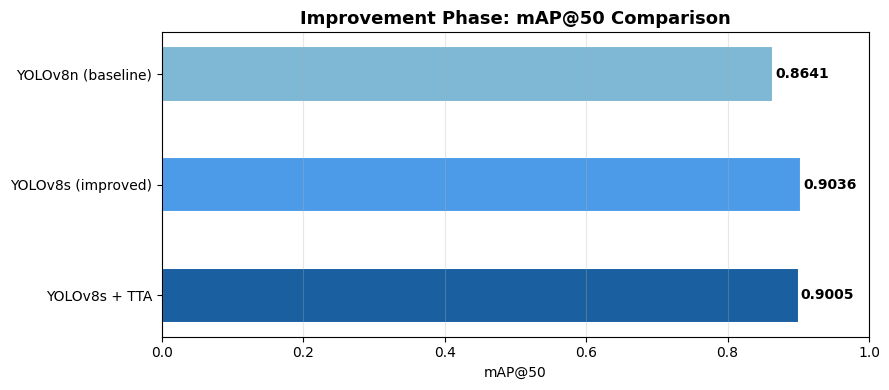

In [32]:
# ── 10d. Improvement Summary Plot ──
improvement_data = pd.DataFrame({
    'Variant': ['YOLOv8n (baseline)', 'YOLOv8s (improved)', 'YOLOv8s + TTA'],
    'mAP@50':  [yolo_map50, yolo_s_map50, yolo_s_tta_map50],
})

fig, ax = plt.subplots(figsize=(9, 4))
bars = ax.barh(improvement_data['Variant'], improvement_data['mAP@50'],
               color=['#7EB8D4','#4C9BE8','#1A5FA0'], edgecolor='white', lw=1.5, height=0.5)
for bar, val in zip(bars, improvement_data['mAP@50']):
    ax.text(bar.get_width() + 0.003, bar.get_y() + bar.get_height()/2,
            f'{val:.4f}', va='center', fontweight='bold')
ax.set_title('Improvement Phase: mAP@50 Comparison', fontsize=13, fontweight='bold')
ax.set_xlabel('mAP@50'); ax.set_xlim(0, 1)
ax.grid(axis='x', alpha=0.3); ax.invert_yaxis()
plt.tight_layout()
plt.savefig(WORK / 'improvement_summary.png', dpi=120, bbox_inches='tight')
plt.show()

## 11. Final Inference Visualization

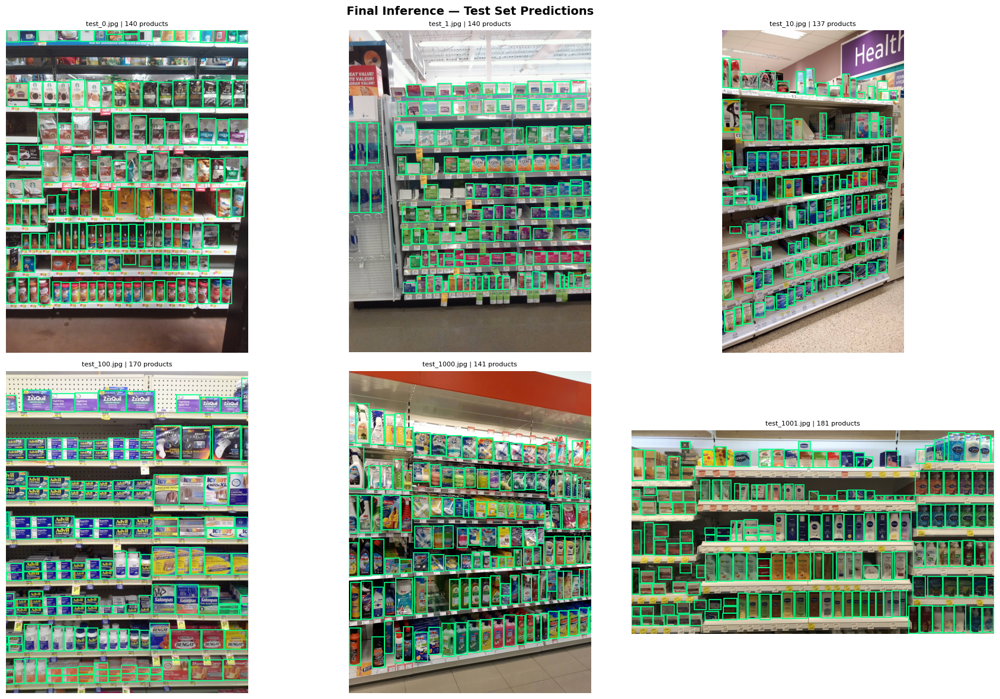

✅ Saved raw bounding box coordinates to predicted_coordinates.json
✅ Final inference complete!


In [33]:
# ── 11a. Best model = YOLOv8s with TTA ──
BEST_MODEL_PATH = best_yolo_s_path
best_model = YOLO(str(BEST_MODEL_PATH))

# ── 11b. Inference on random test images ──
def visualize_inference(model, img_paths, n=6, conf=0.3, iou=0.45, use_tta=True):
    rows = (n + 2) // 3
    fig, axes = plt.subplots(rows, 3, figsize=(18, 6*rows))
    axes = axes.flat
    fig.suptitle('Final Inference — Test Set Predictions', fontsize=14, fontweight='bold')
    all_predictions = {}

    for ax, ip in zip(axes, img_paths[:n]):
        img = np.array(Image.open(ip).convert('RGB'))
        H, W = img.shape[:2]
        results = model.predict(str(ip), conf=conf, iou=iou, augment=use_tta, verbose=False)
        image_name = ip.name
        all_predictions[image_name] = []
        r = results[0]
        ax.imshow(img)
        cnt = 0
        if r.boxes is not None and len(r.boxes) > 0:
            for box, score in zip(r.boxes.xyxy.cpu().numpy(), r.boxes.conf.cpu().numpy()):
                x1,y1,x2,y2 = box
                all_predictions[image_name].append({'box': [float(x1), float(y1), float(x2), float(y2)], 'confidence': float(score)})
                rect = patches.Rectangle((x1,y1),x2-x1,y2-y1,
                                          lw=1.2, edgecolor='#00FF88', facecolor='none')
                ax.add_patch(rect)
                cnt += 1
        ax.set_title(f'{ip.name[:25]} | {cnt} products', fontsize=8)
        ax.axis('off')

    # Hide unused axes
    for ax in list(axes)[n:]:
        ax.set_visible(False)

    plt.tight_layout()
    plt.savefig(WORK / 'final_inference.png', dpi=120, bbox_inches='tight')
    plt.show()

    # Save coordinates to JSON
    with open(WORK / 'predicted_coordinates.json', 'w') as f:
        json.dump(all_predictions, f, indent=2)
    print("✅ Saved raw bounding box coordinates to predicted_coordinates.json")

test_img_paths = sorted(IMG_TEST.glob('*.jpg'))[:6] + sorted(IMG_TEST.glob('*.JPG'))[:6]
if not test_img_paths:  # fallback to val if test is empty
    test_img_paths = [p for p,_ in random.sample(val_pairs, 6)]

visualize_inference(best_model, test_img_paths[:6], n=6, use_tta=True)
print('✅ Final inference complete!')

## 12. Save Outputs

In [34]:
import shutil

# ── Copy best model weights ──
best_model_dest = WORK / 'best_model_yolov8s.pt'
shutil.copy2(best_yolo_s_path, best_model_dest)

# ── Save comparison table as CSV ──
# df_cmp.to_csv(WORK / 'model_comparison.csv', index=False)

# ── Save final metrics JSON ──
final_metrics = {
    'yolov8n': {
        'mAP50': yolo_map50, 'mAP50_95': yolo_map5095,
        'precision': yolo_prec, 'recall': yolo_recall,
        'speed_ms': yolo_speed,
    },
    'faster_rcnn': {
        'mAP50': frcnn_map, 'precision': frcnn_prec, 'recall': frcnn_recall,
        'speed_ms': frcnn_speed,
    },
    'yolov8s_improved': {
        'mAP50': yolo_s_map50, 'mAP50_95': yolo_s_map5095,
    },
    'yolov8s_tta': {
        'mAP50': yolo_s_tta_map50, 'mAP50_95': yolo_s_tta_map5095,
    },
}
with open(WORK / 'final_metrics.json', 'w') as f:
    json.dump(final_metrics, f, indent=2)

# ── Summary ──
print('\n' + '='*60)
print('               FINAL PIPELINE SUMMARY')
print('='*60)
print(f'Best model      : YOLOv8s + TTA')
print(f'Best mAP@50     : {yolo_s_tta_map50:.4f}')
print(f'Best mAP@50:95  : {yolo_s_tta_map5095:.4f}')
print('='*60)
print('\nSaved to /kaggle/working/:')
for f in sorted(WORK.glob('*')):
    if f.is_file():
        size = f.stat().st_size / 1e6
        print(f'  {f.name:<45} {size:.1f} MB')
print('\n✅ Pipeline complete!')

NameError: name 'frcnn_map' is not defined